In [ ]:
import pandas as pd

In [ ]:
import pandas as pd
import os
import numpy as np
import cv2
from matplotlib.pyplot import imread
import matplotlib.pyplot as plt
import random as rn
from sklearn.preprocessing import  StandardScaler
import tensorflow as tf
# import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras import Sequential,Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten , Input ,BatchNormalization, Concatenate
from tensorflow.keras.layers import Conv2D, MaxPooling2D , Conv1D , MaxPooling1D
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score,precision_score,recall_score,confusion_matrix,balanced_accuracy_score
import joblib
import warnings


In [ ]:
SUB = pd.read_csv('sensor.csv', skiprows = 1)
SUB.head()


,Time,X-axis Accelerometer (g),Y-axis Accelerometer (g),Z-axis Accelerometer (g),Roll Gyroscrope (deg/s),Pitch Gyroscope (deg/s),Yaw Gyroscope (deg/s),Luminosity (lux),X-axis Accelerometer (g).1,Y-axis Accelerometer (g).1,...,Yaw Gyroscope (deg/s).4,Luminosity (lux).4,Raw Brainwave Signal,Infrared 1,Infrared 2,Infrared 3,Infrared 4,Infrared 5,Infrared 6,Label
0,2018-07-04T12:04:17.738369,-1.005,0.229,-0.083,-0.671,0.488,-2.683,0.0,-0.981,0.260,...,315.915,2108.154,45.0,1,1,1,1,1,1,7
1,2018-07-04T12:04:17.790509,-1.005,0.228,-0.082,-3.415,-0.549,0.122,0.0,-0.981,0.260,...,344.146,2108.154,1.0,1,1,1,1,1,1,7
2,2018-07-04T12:04:17.836632,-1.005,0.231,-0.079,-2.622,-1.402,-0.549,0.0,-0.975,0.282,...,372.012,2108.154,325.0,1,1,1,1,1,1,7
3,2018-07-04T12:04:17.885262,-1.005,0.231,-0.079,-2.561,-2.195,-1.220,0.0,-0.973,0.301,...,356.463,2108.154,396.0,1,1,1,1,1,1,7
4,2018-07-04T12:04:17.945423,-1.008,0.229,-0.072,-3.537,-2.073,-0.305,0.0,-0.973,0.301,...,126.768,2108.154,-436.0,1,1,1,1,1,1,7


In [ ]:
NA_cols  = SUB.columns[SUB.isnull().any()]
print('Columns contain NULL values : \n', NA_cols )


SUB.dropna(inplace = True)
SUB.drop_duplicates(inplace = True)
print('Sensor Data shape after dropping NaN and redudant samples :',SUB.shape)


times = SUB['Time']

list_DROP = [ 'Infrared 1',
              'Infrared 2',
              'Infrared 3',
              'Infrared 4',
              'Infrared 5',
              'Infrared 6']
SUB.drop(list_DROP, axis = 1, inplace=  True )
SUB.drop( NA_cols, axis = 1, inplace=  True ) # drop NAN COLS

print('Sensor Data shape after dropping columns contain NaN values :',SUB.shape)


Columns contain NULL values : 
 Index(['X-axis Accelerometer (g).1', 'Y-axis Accelerometer (g).1',
       'Z-axis Accelerometer (g).1', 'Roll Gyroscrope (deg/s).1',
       'Pitch Gyroscope (deg/s).1', 'Yaw Gyroscope (deg/s).1',
       'Luminosity (lux).1', 'Raw Brainwave Signal '],
      dtype='object')
Sensor Data shape after dropping NaN and redudant samples : (257070, 44)
Sensor Data shape after dropping columns contain NaN values : (257070, 30)


In [ ]:
SUB.set_index('Time', inplace = True)
SUB.head()

,X-axis Accelerometer (g),Y-axis Accelerometer (g),Z-axis Accelerometer (g),Roll Gyroscrope (deg/s),Pitch Gyroscope (deg/s),Yaw Gyroscope (deg/s),Luminosity (lux),X-axis Accelerometer (g).2,Y-axis Accelerometer (g).2,Z-axis Accelerometer (g).2,...,Yaw Gyroscope (deg/s).3,Luminosity (lux).3,X-axis Accelerometer (g).4,Y-axis Accelerometer (g).4,Z-axis Accelerometer (g).4,Roll Gyroscrope (deg/s).4,Pitch Gyroscope (deg/s).4,Yaw Gyroscope (deg/s).4,Luminosity (lux).4,Label
Time,,,,,,,,,,,,,,,,,,,,,
2018-07-04T12:04:17.738369,-1.005,0.229,-0.083,-0.671,0.488,-2.683,0.0,0.146,0.895,0.367,...,9.207,1231.336,-1.240,-0.557,0.227,-75.854,44.024,315.915,2108.154,7
2018-07-04T12:04:17.790509,-1.005,0.228,-0.082,-3.415,-0.549,0.122,0.0,0.146,0.895,0.367,...,5.122,1231.336,-1.240,-0.557,0.227,-28.780,55.549,344.146,2108.154,7
2018-07-04T12:04:17.836632,-1.005,0.231,-0.079,-2.622,-1.402,-0.549,0.0,0.178,0.896,0.373,...,4.329,1231.336,-1.884,-0.687,0.251,27.256,87.134,372.012,2108.154,7
2018-07-04T12:04:17.885262,-1.005,0.231,-0.079,-2.561,-2.195,-1.220,0.0,0.160,0.895,0.372,...,0.366,1231.336,-1.884,-0.687,0.251,2.866,117.683,356.463,2108.154,7
2018-07-04T12:04:17.945423,-1.008,0.229,-0.072,-3.537,-2.073,-0.305,0.0,0.160,0.895,0.372,...,-3.232,1231.336,-1.597,-0.646,0.112,10.000,30.671,126.768,2108.154,7


In [ ]:
cam = '1'

image = 'image_' + cam +  '.npy'
name = 'name_' + cam +  '.npy'
label = 'label_' + cam +  '.npy'

img_1 = np.load(image)
label_1 = np.load(label)
name_1 = np.load(name)

cam = '2'

image = 'image_' + cam +  '.npy'
name = 'name_' + cam +  '.npy'
label = 'label_' + cam +  '.npy'

img_2 = np.load(image)
label_2 = np.load(label)
name_2 = np.load(name)


In [ ]:
print(len(img_1))
print(len(name_1))
print(len(img_2))
print(len(name_2))


294705
294705
294705
294705


In [ ]:
redundant_1 = list(set(name_1) - set(times))
redundant_2 = list(set(name_2) - set(times))
ind = np.arange(0,294677)
if len(name_1) == len(ind):
    red_in1 = ind[np.isin(name_1, redundant_1)]
else:
    # Adjust lengths to match
    min_length = min(len(name_1), len(ind))
    red_in1 = ind[:min_length][np.isin(name_1[:min_length], redundant_1[:min_length])]

# Proceed with deletion if there are elements to remove
if red_in1.size > 0:
    name_1 = np.delete(name_1, red_in1)
    img_1 = np.delete(img_1, red_in1, axis=0)
    label_1 = np.delete(label_1, red_in1)

In [ ]:
if len(name_2) == len(ind):
    red_in2 = ind[np.isin(name_2, redundant_2)]
else:
    # Adjust lengths to match
    min_length = min(len(name_2), len(ind))
    red_in2 = ind[:min_length][np.isin(name_2[:min_length], redundant_2[:min_length])]

# Proceed with deletion if there are elements to remove
if red_in1.size > 0:
    name_2 = np.delete(name_2, red_in2)
    img_2 = np.delete(img_2, red_in2, axis=0)
    label_2 = np.delete(label_2, red_in1)

else:
    print("No elements to delete.")

In [ ]:
print(len(name_2))
print(len(name_1))


258141
258141


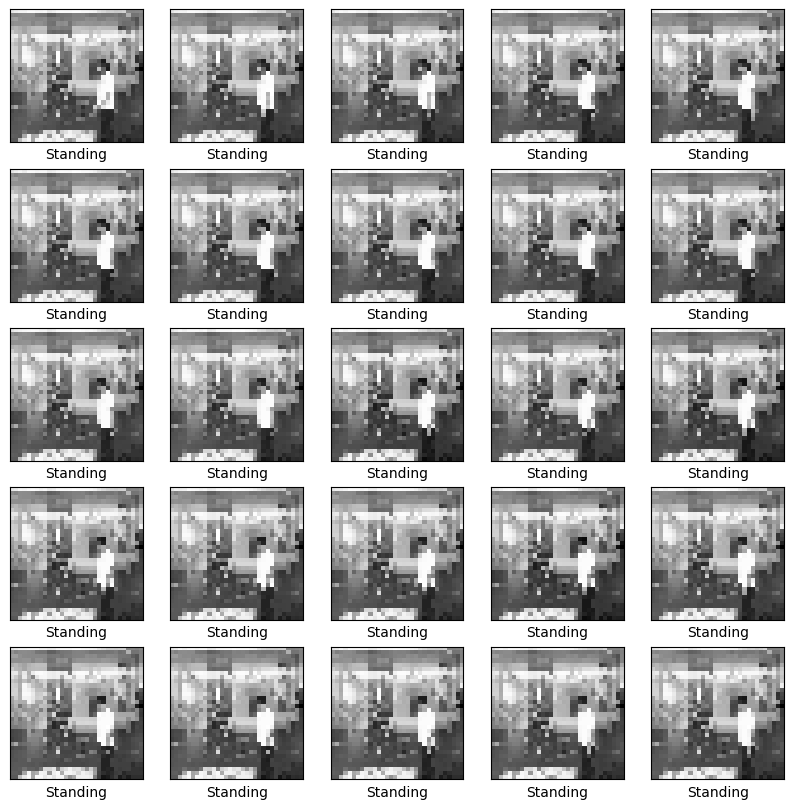

In [ ]:
class_name = [    '?????' ,
                'Falling hands' ,
                 'Falling knees' ,
                 'Falling backwards',
                 'Falling sideward' ,
                ' Falling chair',
                ' Walking',
                 'Standing' ,
                 'Sitting' ,
                 'Picking object' ,
                 'Jumping' ,
                 'Laying' ]

plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(img_1[i], cmap = 'gray')
    plt.xlabel(class_name[label_1[i]])
plt.show()


In [ ]:
data = SUB.loc[name_1].values
print(img_1.shape)
print(img_2.shape)
print(data.shape)

(258141, 32, 32)
(258141, 32, 32)
(258141, 29)


In [ ]:
# def set_seed():
#     SEED = 0
#     os.environ['PYTHONHASHSEED']=str(SEED)
#     np.random.seed(SEED)
#     tf.random.set_seed(SEED)
#     rn.seed(SEED)
#     session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
#     sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
#     tf.compat.v1.keras.backend.set_session(sess)

# set_seed()
X_csv, y_csv = data[:,:-1] , data[:,-1]

y_csv = np.where(y_csv == 20 , 0, y_csv)
label_1 = np.where(label_1 == 20 , 0, label_1)
label_2 = np.where(label_2 == 20, 0, label_2)
X_train_csv,X_rem_csv,y_train_csv,y_rem_csv = train_test_split(X_csv, y_csv,
                                                                 train_size = 0.6,
                                                                 random_state = 42)

X_val_csv, X_test_csv, y_val_csv, y_test_csv = train_test_split(X_rem_csv, y_rem_csv,
                                                                  test_size = 0.5,
                                                                  random_state = 42)

print('X_train_csv shape : ',X_train_csv.shape)
print('X_test_csv shape : ',X_test_csv.shape)
print('X_val_csv shape : ',X_val_csv.shape)
print('y_train_csv shape : ',y_train_csv.shape)
print('y_test_csv shape : ',y_test_csv.shape)
print('y_val_csv shape : ',y_val_csv.shape)

Y_train_csv = to_categorical(y_train_csv, 12)
Y_test_csv = to_categorical(y_test_csv, 12)
Y_val_csv = to_categorical(y_val_csv, 12)

print('Y_train_csv shape : ',Y_train_csv.shape)
print('Y_test_csv shape : ',Y_test_csv.shape)
print('Y_val_csv shape : ',Y_val_csv.shape)



X_train_1,X_rem_1,y_train_1,y_rem_1 = train_test_split(img_1,label_1,
                                                         train_size = 0.6,
                                                         random_state = 42,
                                                         )

X_val_1,X_test_1,y_val_1,y_test_1 = train_test_split(X_rem_1,y_rem_1,
                                                         test_size = 0.5,
                                                         random_state = 42,
                                                         )
print('*'*20)
print('X_train_1 shape : ',X_train_1.shape)
print('X_test_1 shape : ',X_test_1.shape)
print('X_val_1 shape : ',X_val_1.shape)
print('y_train_1 shape : ',y_train_1.shape)
print('y_test_1 shape : ',y_test_1.shape)
print('y_val_1 shape : ',y_val_1.shape)


Y_train_1 = to_categorical(y_train_1, 12)
Y_test_1 = to_categorical(y_test_1, 12)
Y_val_1 = to_categorical(y_val_1, 12)

print('Y_train_1 shape : ',Y_train_1.shape)
print('Y_test_1 shape : ',Y_test_1.shape)
print('Y_val_1 shape : ',Y_val_1.shape)



X_train_2,X_rem_2,y_train_2,y_rem_2 = train_test_split(img_2,label_2,
                                                         train_size = 0.6,
                                                         random_state = 42,
                                                         )

X_val_2,X_test_2,y_val_2,y_test_2 = train_test_split(X_rem_2,y_rem_2,
                                                         test_size = 0.5,
                                                         random_state = 42,
                                                         )

print('*'*20)
print('X_train_2 shape : ',X_train_2.shape)
print('X_test_2 shape : ',X_test_2.shape)
print('X_val_2 shape : ',X_val_2.shape)
print('y_train_2 shape : ',y_train_2.shape)
print('y_test_2 shape : ',y_test_2.shape)
print('y_val_2 shape : ',y_val_2.shape)


Y_train_2 = to_categorical(y_train_2, 12)
Y_test_2 = to_categorical(y_test_2, 12)
Y_val_2 = to_categorical(y_val_2, 12)

print('Y_train_2 shape : ',Y_train_2.shape)
print('Y_test_2 shape : ',Y_test_2.shape)
print('Y_val_2 shape : ',Y_val_2.shape)


X_train_csv shape :  (154884, 28)
X_test_csv shape :  (51629, 28)
X_val_csv shape :  (51628, 28)
y_train_csv shape :  (154884,)
y_test_csv shape :  (51629,)
y_val_csv shape :  (51628,)
Y_train_csv shape :  (154884, 12)
Y_test_csv shape :  (51629, 12)
Y_val_csv shape :  (51628, 12)
********************
X_train_1 shape :  (154884, 32, 32)
X_test_1 shape :  (51629, 32, 32)
X_val_1 shape :  (51628, 32, 32)
y_train_1 shape :  (154884,)
y_test_1 shape :  (51629,)
y_val_1 shape :  (51628,)
Y_train_1 shape :  (154884, 12)
Y_test_1 shape :  (51629, 12)
Y_val_1 shape :  (51628, 12)
********************
X_train_2 shape :  (154884, 32, 32)
X_test_2 shape :  (51629, 32, 32)
X_val_2 shape :  (51628, 32, 32)
y_train_2 shape :  (154884,)
y_test_2 shape :  (51629,)
y_val_2 shape :  (51628,)
Y_train_2 shape :  (154884, 12)
Y_test_2 shape :  (51629, 12)
Y_val_2 shape :  (51628, 12)


In [ ]:
print((y_train_1 == y_train_csv).all())
print((y_train_2 == y_train_csv).all())

print((y_val_1 == y_val_csv).all())
print((y_val_2 == y_val_csv).all())

print((y_test_1 == y_test_csv).all())
print((y_test_2 == y_test_csv).all())


True
True
True
True
True
True


In [ ]:
shape1, shape2 = 32,32
X_train_1 = X_train_1.reshape(X_train_1.shape[0], shape1, shape2 ,1)
X_train_2 = X_train_2.reshape(X_train_2.shape[0], shape1, shape2 ,1)
X_val_1 = X_val_1.reshape(X_val_1.shape[0], shape1, shape2 , 1)
X_val_2 = X_val_2.reshape(X_val_2.shape[0], shape1, shape2 , 1)
X_test_1 = X_test_1.reshape(X_test_1.shape[0], shape1, shape2 ,1)
X_test_2 = X_test_2.reshape(X_test_2.shape[0], shape1, shape2 ,1)


In [ ]:
X_train_1_scaled = X_train_1/255.0
X_train_2_scaled = X_train_2/255.0

X_val_1_scaled = X_val_1/255.0
X_val_2_scaled = X_val_2/255.0

X_test_1_scaled = X_test_1/255.0
X_test_2_scaled = X_test_2/255.0

In [ ]:
print(X_train_1_scaled.shape)
print(X_test_1_scaled.shape)
print(X_val_1_scaled.shape)

print(X_train_2_scaled.shape)
print(X_test_2_scaled.shape)
print(X_val_2_scaled.shape)

(154884, 32, 32, 1)
(51629, 32, 32, 1)
(51628, 32, 32, 1)
(154884, 32, 32, 1)
(51629, 32, 32, 1)
(51628, 32, 32, 1)


In [ ]:
def display_result(y_test , y_pred) :
    print('Accuracy score : ', accuracy_score(y_test , y_pred) )
    print('Precision score : ', precision_score(y_test , y_pred, average='weighted'))
    print('Recall score : ', recall_score(y_test , y_pred, average='weighted'))
    print('F1 score : ', f1_score(y_test , y_pred, average='weighted'))


def scaled_data(X_train, X_test, X_val):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    X_val_scaled = scaler.transform(X_val)
    return X_train_scaled, X_test_scaled , X_val_scaled


def convert_to_categorical (y_train, y_test, y_val) :
    print('--------------------------To Categorical ---------------------------')
    Y_train = to_categorical(y_train, 12)
    Y_test = to_categorical(y_test, 12)
    Y_val = to_categorical(y_val,12)

    print('Before    : ', y_train[0])
    print('After     : ',Y_train[0])
    return Y_train, Y_test, Y_val


X_train_csv_scaled, X_test_csv_scaled , X_val_csv_scaled = scaled_data(X_train_csv, X_test_csv, X_val_csv)
Y_train_csv , Y_test_csv , Y_val_csv = convert_to_categorical (y_train_csv, y_test_csv, y_val_csv)


--------------------------To Categorical ---------------------------
Before    :  6.0
After     :  [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]


In [ ]:
def csv_MLP(input_shapes):
    model =  Sequential([
                    Dense(2000, activation = tf.nn.relu, input_shape = (input_shapes,)),
                    BatchNormalization(),
                    Dense(600, activation = tf.nn.relu),
                    BatchNormalization(),
                    Dropout(0.2),
                    Dense(12, activation='softmax'),
                ])
    model.compile(
                  optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001 , name = 'Adam'),
                  loss='categorical_crossentropy' ,
                  metrics =[
                           keras.metrics.CategoricalAccuracy( name='categorical_accuracy'),
                           keras.metrics.Precision( name = 'precision' ),
                           keras.metrics.Recall( name = 'recall' ),
                          ] )
    return model
model_MLP = csv_MLP(X_train_csv_scaled.shape[1])
model_MLP.summary()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 2000)                │          58,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 2000)                │           8,000 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 600)                 │       1,200,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 600)                 │           2,400 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 600)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 12)                  │           7,212 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,276,212 (4.87 MB)

 Trainable params: 1,271,012 (4.85 MB)

 Non-trainable params: 5,200 (20.31 KB)

In [ ]:
f1_callback_MLP = ModelCheckpoint("finalmodel.keras",
                              monitor='val_f1_score',
                              verbose=1,
                              save_best_only=True,
                              mode='max')

history_MLP = model_MLP.fit(X_train_csv_scaled,Y_train_csv,
                                      epochs= 50,
                                      batch_size=  2**10,
                                      validation_data=(X_val_csv_scaled,Y_val_csv),
                                      callbacks = [f1_callback_MLP]
                                     )


Epoch 1/50
152/152 ━━━━━━━━━━━━━━━━━━━━ 51s 292ms/step - categorical_accuracy: 0.9988 - loss: 0.0037 - precision: 0.9989 - recall: 0.9988 - val_categorical_accuracy: 0.9890 - val_loss: 0.0651 - val_precision: 0.9894 - val_recall: 0.9888
Epoch 2/50


/usr/local/lib/python3.10/dist-packages/keras/src/callbacks/model_checkpoint.py:206: UserWarning: Can save best model only with val_f1_score available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)


KeyboardInterrupt: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Get predictions from the model
y_pred = model.predict(X_test_csv_scaled)  # Use X_test_csv_scaled for testing
y_pred_classes = np.argmax(y_pred, axis=1)  # Predicted classes
y_true_classes = np.argmax(Y_test_csv, axis=1)  # True classes

# Calculate metrics
accuracy = accuracy_score(y_true_classes, y_pred_classes)
precision = precision_score(y_true_classes, y_pred_classes, average='weighted')
recall = recall_score(y_true_classes, y_pred_classes, average='weighted')
f1 = f1_score(y_true_classes, y_pred_classes, average='weighted')

# Print the calculated values
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

1614/1614 ━━━━━━━━━━━━━━━━━━━━ 19s 11ms/step
Accuracy: 0.9892
Precision: 0.9889
Recall: 0.9892
F1 Score: 0.9890


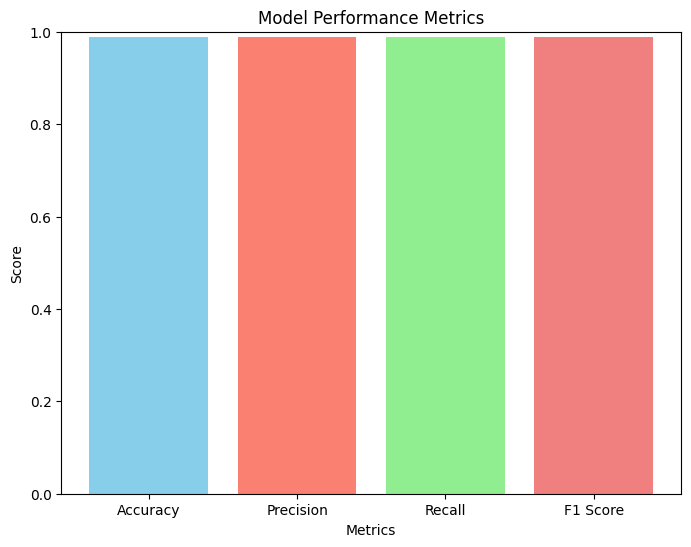

In [ ]:
metrics_values = [accuracy, precision, recall, f1]
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']

plt.figure(figsize=(8, 6))
plt.bar(metrics_names, metrics_values, color=['skyblue', 'salmon', 'lightgreen', 'lightcoral'])
plt.ylim(0, 1)  # All metrics are between 0 and 1
plt.title("Model Performance Metrics")
plt.ylabel("Score")
plt.xlabel("Metrics")
plt.show()


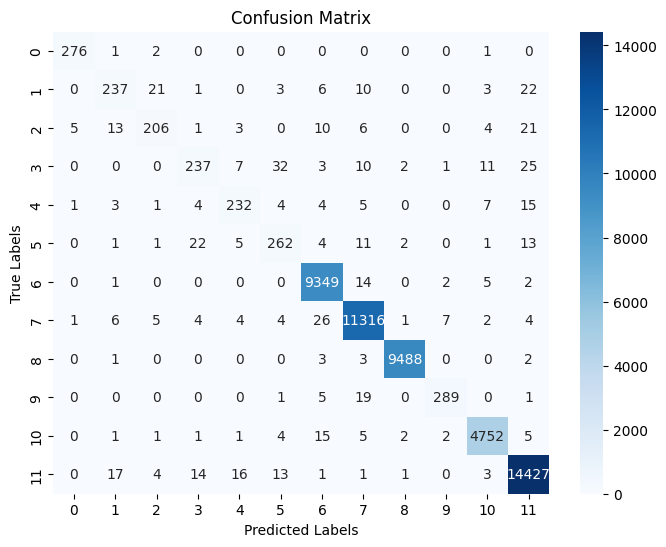

In [ ]:
import seaborn as sns
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)

# Plot Confusion Matrix using Seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_true_classes), yticklabels=np.unique(y_true_classes))
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=c411106ccc69eeda7486577e33ee7b060a2ad29a42b9611493c5a2623b553839
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
# prompt: Use XAI Lime technique
import lime
import lime.lime_tabular
from tensorflow.keras.models import load_model

model = load_model('MLP_csv.hdf5')

# Assuming 'model' is your trained model and 'X_test_csv_scaled' is your test data
# and 'y_test_csv' is your true labels

# Create a LimeTabularExplainer object
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_csv_scaled,  # Training data
    feature_names=SUB.columns[:-1],  # Feature names from your dataset
    class_names=class_name,  # Class names
    discretize_continuous=True  # Discretize continuous features
)

# Choose an instance to explain
instance_idx = 0  # Choose the instance you want to explain
instance = X_test_csv_scaled[instance_idx, :]

# Explain the prediction for the chosen instance
explanation = explainer.explain_instance(instance, model.predict, num_features=5)

# Display the explanation
explanation.show_in_notebook(show_table=True, show_all=False)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step


In [ ]:
# prompt: Use XAI Lime technique
import lime
import lime.lime_tabular

# Assuming 'model' is your trained model and 'X_test_csv_scaled' is your test data
# and 'y_test_csv' is your true labels

# Create a LimeTabularExplainer object
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_csv_scaled,  # Training data
    feature_names=SUB.columns[:-1],  # Feature names from your dataset
    class_names=class_name,  # Class names
    discretize_continuous=True  # Discretize continuous features
)

# Choose an instance to explain
instance_idx = 0  # Choose the instance you want to explain
instance = X_test_csv_scaled[instance_idx, :]

# Explain the prediction for the chosen instance
explanation = explainer.explain_instance(instance, model.predict, num_features=5)

# Display the explanation
explanation.show_in_notebook(show_table=True, show_all=False)

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


In [ ]:
import lime
import lime.lime_tabular
import numpy as np

# Assuming 'model' is your trained model, and 'X_train_csv_scaled' and 'X_test_csv_scaled' are your scaled training and test data.
# 'y_test_csv' is your true labels (not directly used here but may be used for evaluation purposes).
# 'SUB' is your dataset from which 'feature_names' will be derived.
# 'class_name' is the list of class names corresponding to your classification task.

# Create a LimeTabularExplainer object
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_csv_scaled,  # Training data
    feature_names=SUB.columns[:-1],  # Feature names from your dataset (excluding the label column)
    class_names=class_name,  # Class names for classification task (for multi-class classification)
    discretize_continuous=True  # Discretize continuous features for better interpretability
)

# Loop through different instances and explain their predictions
num_instances = 5  # Number of instances you want to explain from the test data

for instance_idx in range(num_instances):
    instance = X_test_csv_scaled[instance_idx, :]  # Select the instance from the test set

    # Explain the prediction for the chosen instance
    # For multi-class classification, 'model.predict' will return probabilities
    explanation = explainer.explain_instance(instance, model.predict, num_features=5)

    # Display the explanation in the notebook
    print(f"Explanation for instance {instance_idx}:")
    explanation.show_in_notebook(show_table=True, show_all=False)
    print("\n" + "="*50 + "\n")


157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Explanation for instance 0:




157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Explanation for instance 1:




157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Explanation for instance 2:




157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Explanation for instance 3:




157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Explanation for instance 4:


In [ ]:
def model_csv_img (num_csv_features , img_shape1, img_shape2):
    inputs1 = Input(shape= ( num_csv_features ,1 ) )
    conv1 = Conv1D(filters=10, kernel_size=3, activation='relu')(inputs1)
    pool1 = MaxPooling1D(pool_size=2)(conv1)
    batch1 = BatchNormalization()(pool1)
    flat1 = Flatten()(batch1)
    #--------------------------
    inputs2 = Input(shape=  (img_shape1, img_shape2, 1) )
    conv2 = Conv2D(filters = 16 ,
                   kernel_size = (3, 3),
                   activation=  tf.nn.relu )(inputs2)
    pool2 = MaxPooling2D(pool_size = (2,2))(conv2)
    batch2 = BatchNormalization()(pool2)
    flat2 = Flatten()(batch2)
    #--------------------------
    inputs3 = Input(shape=  (img_shape1, img_shape2, 1) )
    conv3 = Conv2D(16 ,(3, 3), activation='relu')(inputs3)
    pool3 = MaxPooling2D(pool_size = (2,2))(conv3)
    batch3 = BatchNormalization()(pool3)
    flat3 = Flatten()(batch3)
    #--------------------------
    merged = Concatenate(axis=1)([flat1, flat2,flat3])
    dense1 = Dense(units = 600, activation='relu')(merged)
    dense2 = Dense(units = 1200, activation='relu')(dense1)
    dropout = Dropout(0.2)(dense2)
    outputs = Dense(12, activation='softmax')(dropout)
    model  = Model(inputs=[inputs1, inputs2, inputs3], outputs=outputs)

    model.compile(
                 optimizer = tf.keras.optimizers.Adam(0.001),
                 loss = keras.losses.CategoricalCrossentropy(name='categorical_crossentropy'),
                 metrics = [
                            keras.metrics.CategoricalAccuracy(name='categorical_accuracy'),
                            keras.metrics.Precision(name='precision'),
                            keras.metrics.Recall(name='recall'),
                           ]
    )

    return model


In [ ]:
model_concatenate = model_csv_img (X_train_csv_scaled.shape[1] ,
                                   32,
                                   32)


In [ ]:
model_concatenate.summary()


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 28, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_2             │ (None, 32, 32, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_3             │ (None, 32, 32, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d (Conv1D)           │ (None, 26, 10)         │             40 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 30, 30, 16)     │            160 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 30, 30, 16)     │            160 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d             │ (None, 13, 10)         │              0 │ conv1d[0][0]           │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 15, 15, 16)     │              0 │ conv2d[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 15, 15, 16)     │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 13, 10)         │             40 │ max_pooling1d[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 15, 15, 16)     │             64 │ max_pooling2d[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 15, 15, 16)     │             64 │ max_pooling2d_1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 130)            │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 3600)           │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_2 (Flatten)       │ (None, 3600)           │              0 │ batch_normalization_4… │
├──────────────────────

 Total params: 5,134,740 (19.59 MB)

 Trainable params: 5,134,656 (19.59 MB)

 Non-trainable params: 84 (336.00 B)

In [ ]:
val_callback_concat = ModelCheckpoint("model_concatenate.keras",
                              monitor='categorical_accuracy',
                              verbose=1,
                              save_best_only=True,
                              mode='max')
history_concatenate = model_concatenate.fit(x = [X_train_csv_scaled,X_train_1_scaled, X_train_2_scaled],
                      y=  Y_train_csv,
                      epochs= 3,
                      batch_size = 2**10 ,
                      validation_data = ([X_val_csv_scaled,X_val_1_scaled, X_val_2_scaled] , Y_val_csv),
                      callbacks = [val_callback_concat]
                     )





Epoch 1/3
152/152 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.8225 - loss: 0.9376 - precision: 0.8694 - recall: 0.7995
Epoch 1: categorical_accuracy improved from -inf to 0.92830, saving model to model_concatenate.keras
152/152 ━━━━━━━━━━━━━━━━━━━━ 312s 2s/step - categorical_accuracy: 0.8232 - loss: 0.9336 - precision: 0.8700 - recall: 0.8002 - val_categorical_accuracy: 0.9518 - val_loss: 0.8407 - val_precision: 0.9989 - val_recall: 0.4431
Epoch 2/3
152/152 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.9847 - loss: 0.0465 - precision: 0.9898 - recall: 0.9803
Epoch 2: categorical_accuracy improved from 0.92830 to 0.98673, saving model to model_concatenate.keras
152/152 ━━━━━━━━━━━━━━━━━━━━ 307s 2s/step - categorical_accuracy: 0.9847 - loss: 0.0464 - precision: 0.9898 - recall: 0.9803 - val_categorical_accuracy: 0.9746 - val_loss: 0.1832 - val_precision: 0.9921 - val_recall: 0.9449
Epoch 3/3
152/152 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.9914 

dict_keys(['categorical_accuracy', 'loss', 'precision', 'recall', 'val_categorical_accuracy', 'val_loss', 'val_precision', 'val_recall'])


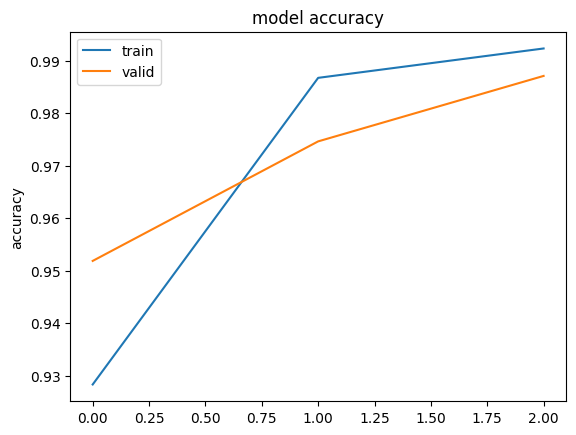

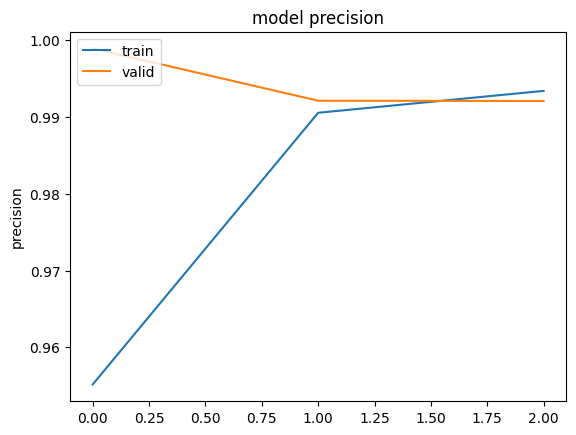

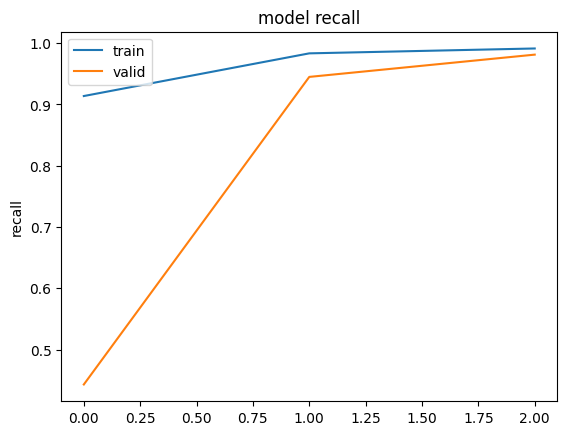

In [ ]:
print(history_concatenate.history.keys())
plt.plot(history_concatenate.history['categorical_accuracy'])
plt.plot(history_concatenate.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()

plt.plot(history_concatenate.history['precision'])
plt.plot(history_concatenate.history['val_precision'])
plt.title('model precision')
plt.ylabel('precision')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()

plt.plot(history_concatenate.history['recall'])
plt.plot(history_concatenate.history['val_recall'])
plt.title('model recall')
plt.ylabel('recall')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()


# plt.plot(history_concatenate.history['f1_score'])
# plt.plot(history_concatenate.history['val_f1_score'])
# plt.title('model f1_score')
# plt.ylabel('f1_score')
# plt.xlabel('epoch')
# plt.legend(['train', 'valid'], loc='upper left')
# plt.show()

In [ ]:
print("best model: ")
model_concatenate.load_weights("model_concatenate.keras")
print(model_concatenate.evaluate([X_val_csv_scaled, X_val_1_scaled, X_val_2_scaled] , Y_val_1))
print(model_concatenate.evaluate([X_test_csv_scaled, X_test_1_scaled, X_test_2_scaled] , Y_test_1))


best model: 
1614/1614 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - categorical_accuracy: 0.9874 - loss: 0.0499 - precision: 0.9923 - recall: 0.9816
[0.0507548451423645, 0.9871000051498413, 0.9920689463615417, 0.9812504649162292]
1614/1614 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - categorical_accuracy: 0.9868 - loss: 0.0519 - precision: 0.9915 - recall: 0.9798
[0.05070863664150238, 0.9869065880775452, 0.9918668866157532, 0.9802824258804321]


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
import cv2  # For image processing

# Define the preprocess_image function
def preprocess_image(img_path, img_shape1, img_shape2):
    # Load the image from the file path
    img = image.load_img(img_path, target_size=(img_shape1, img_shape2), color_mode='grayscale')

    # Convert the image to a numpy array
    img_array = image.img_to_array(img)

    # Normalize the image (scale the pixel values to between 0 and 1)
    img_array /= 255.0

    # Reshape the image for the model (add the batch dimension)
    img_array = np.expand_dims(img_array, axis=0)

    return img_array


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step

Predicted class: [1]
Prediction probabilities: [[2.9539845e-03 8.2053840e-01 2.0626104e-02 2.1707591e-02 6.9268100e-02
  1.9298593e-03 1.0411337e-02 1.3001022e-03 4.3757641e-04 1.0087520e-03
  2.4004469e-03 4.7417659e-02]]


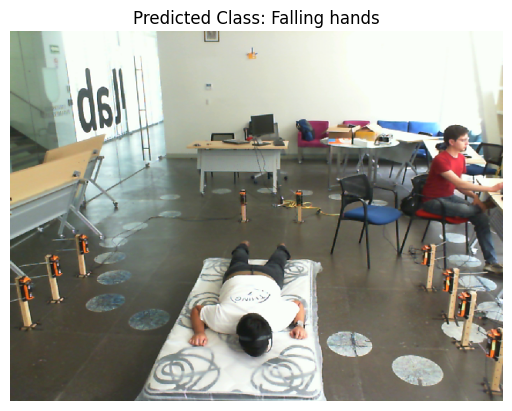

In [ ]:
from PIL import Image
from tensorflow.keras.preprocessing.image import img_to_array
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image


def preprocess_image(img_path, img_shape1, img_shape2):
    try:
        # Load the image using PIL
        img = Image.open(img_path).convert('L')  # Convert to grayscale

        # Resize the image
        img = img.resize((img_shape1, img_shape2))

        # Convert the image to a NumPy array
        img_array = img_to_array(img)

        # Normalize pixel values
        img_array /= 255.0

        # Add batch and channel dimensions
        img_array = np.expand_dims(img_array, axis=0)
        img_array = np.expand_dims(img_array, axis=-1)

        return img_array
    except FileNotFoundError:
        print(f"Error: Image file not found at {img_path}")
        return None
    except Exception as e:
        print(f"An error occurred during image preprocessing: {e}")
        return None


# Example usage
img_path = '/content/2018-07-04T12_05_05.700398.png'  # Replace with your image path
img_shape1 = 32 #  Update to match model input
img_shape2 = 32 # Update to match model input

# Preprocess the image
img_array = preprocess_image(img_path, img_shape1, img_shape2)

if img_array is not None:
    # Load the model
    model = load_model('model_concatenate.keras')

    # Example CSV features (replace with your actual data and ensure correct shape)
    csv_features = np.array([[1, 2, 3, 4, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])
    csv_features = np.expand_dims(csv_features, axis=-1)

    # Create the input data
    input_data = [csv_features, img_array, img_array]

    img = Image.open(img_path)

        # Display the image
    plt.imshow(img)
    plt.axis('off')  # Hide axis ticks and labels

    # Make the prediction
    prediction = model.predict(input_data)

    # Get the predicted class
    predicted_class = np.argmax(prediction, axis=1)
    print()
    predicted_class_label = class_name[predicted_class[0]]
    print(f"Predicted class: {predicted_class}")
    print(f"Prediction probabilities: {prediction}")
    plt.title(f"Predicted Class: {predicted_class_label}")


In [ ]:
/content/2018-07-04T12_05_05.700398.png

['?????',
 'Falling hands',
 'Falling knees',
 'Falling backwards',
 'Falling sideward',
 ' Falling chair',
 ' Walking',
 'Standing',
 'Sitting',
 'Picking object',
 'Jumping',
 'Laying']

In [ ]:
model = load_model('MLP_csv.hdf5')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# prompt: import pandas as pd
# # Extracting values for table
# report_dict = classification_report(y_true_classes, y_pred_classes, output_dict=True, target_names=['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral'])
# report_df = pd.DataFrame(report_dict).transpose()
# # Display the DataFrame in tabular form
# report_df[['precision', 'recall', 'f1-score']].round(2)  # Rounding for presentation for this same except use class_labels and y_true, y_pred use as well NameError: name 'y_true_classes' is not defined

from sklearn.metrics import classification_report

# Assuming y_true and y_pred are defined and hold your true and predicted labels
# Replace these with your actual data
y_pred = model.predict(X_test_csv_scaled)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(Y_test_csv, axis=1)

# X_train_csv_scaled, X_test_csv_scaled , X_val_csv_scaled = scaled_data(X_train_csv, X_test_csv, X_val_csv)
# Y_train_csv , Y_test_csv , Y_val_csv = convert_to_categorical (y_train_csv, y_test_csv, y_val_csv)
# Assuming you have a list of class names
class_labels=['?????',
 'Falling hands',
 'Falling knees',
 'Falling backwards',
 'Falling sideward',
 ' Falling chair',
 ' Walking',
 'Standing',
 'Sitting',
 'Picking object',
 'Jumping',
 'Laying']
report_dict = classification_report(y_true, y_pred, output_dict=True, target_names=class_labels[:len(y_true)]) # Adjust target_names length
report_df = pd.DataFrame(report_dict).transpose()

print(report_df[['precision', 'recall', 'f1-score']].round(2))

1614/1614 ━━━━━━━━━━━━━━━━━━━━ 19s 12ms/step
                   precision  recall  f1-score
?????                   0.98    0.99      0.98
Falling hands           0.84    0.78      0.81
Falling knees           0.85    0.77      0.81
Falling backwards       0.83    0.72      0.77
Falling sideward        0.87    0.84      0.85
 Falling chair          0.81    0.81      0.81
 Walking                0.99    1.00      0.99
Standing                0.99    0.99      0.99
Sitting                 1.00    1.00      1.00
Picking object          0.96    0.92      0.94
Jumping                 0.99    0.99      0.99
Laying                  0.99    1.00      0.99
accuracy                0.99    0.99      0.99
macro avg               0.93    0.90      0.91
weighted avg            0.99    0.99      0.99
